In [1]:
import geopandas as gpd
import pandas as pd
from datetime import datetime
import os 

directory = '/Users/arthurcalvi/Data/results/disturbances/matching_france_v04_EPSG3857.parquet'
gdf = gpd.read_parquet(directory)

In [3]:
gdf.columns

Index(['index_SS', 'year', 'geometry', 'class_SS', 'index_DFDE',
       'start_date_DFDE', 'end_date_DFDE', 'name', 'class_DFDE', 'index_FI',
       'class_FI', 'start_date_FI', 'end_date_FI', 'sjoin_distance',
       'overlap_DFDE_FI', 'area_DFDE', 'class', 'probability'],
      dtype='object')

In [20]:
import pandas as pd
cause = 'Fire'
year = 2013
t_gdf = gdf[ (gdf.probability > 0.3) & (gdf['class'] == cause)].drop_duplicates(subset=['index_SS', 'year'])
t_gdf['area'] = t_gdf.geometry.area
t_gdf = t_gdf[ (t_gdf.area > (10*30)**2) & (t_gdf.year < year) & (t_gdf.year > 2000)]
t_gdf_area = t_gdf.sort_values('area', ascending=False).iloc[:10]
t_gdf_prob = t_gdf.sort_values('class', ascending=False).iloc[:10]
t_gdf = gpd.GeoDataFrame(pd.concat([t_gdf_area, t_gdf_prob]), crs=t_gdf.crs)
table = t_gdf[(t_gdf['probability'] > 0.5)].sort_values('area', ascending=False)
table.head(10)

,index_SS,year,geometry,class_SS,index_DFDE,start_date_DFDE,end_date_DFDE,name,class_DFDE,index_FI,class_FI,start_date_FI,end_date_FI,sjoin_distance,overlap_DFDE_FI,area_DFDE,class,probability,area
17256568,5854891,2010,"POLYGON ((1000012.121 5123923.052, 1000092.117...",Fire,NaN,NaT,NaT,None,None,40635.0,Fire,2010-12-27 18:00:00,2015-12-28,0.0,False,NaN,Fire,0.625270,3.413759e+07
17206943,5816747,2003,"POLYGON ((718051.316 5375082.643, 718049.488 5...",Fire,NaN,NaT,NaT,None,None,12950.0,Fire,2001-12-27 18:00:00,2006-12-28,0.0,False,NaN,Fire,0.788752,3.319216e+07
17230069,5830819,2004,"POLYGON ((713530.485 5357358.296, 713571.493 5...",Fire,NaN,NaT,NaT,None,None,5613.0,Fire,2000-12-27 18:00:00,2005-12-28,0.0,False,NaN,Fire,0.787914,2.991085e+07
17244403,5844573,2006,"POLYGON ((670887.039 5324443.332, 670885.012 5...",Fire,NaN,NaT,NaT,None,None,NaN,None,NaT,NaT,NaN,False,NaN,Fire,0.920000,2.933897e+06
17244381,5844551,2006,"POLYGON ((660145.360 5445180.322, 660186.762 5...",Fire,NaN,NaT,NaT,None,None,NaN,None,NaT,NaT,NaN,False,NaN,Fire,0.920000,2.303652e+05
17244386,5844556,2006,"POLYGON ((660012.659 5445340.401, 660010.535 5...",Fire,NaN,NaT,NaT,None,None,NaN,None,NaT,NaT,NaN,False,NaN,Fire,0.920000,1.247169e+05


# Research

In [38]:
%load_ext autoreload
%autoreload 2
from chronos import Chronos

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


['landsat-5', 'landsat-7', 'landsat-8']


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  38 out of  38 | elapsed:    7.9s finished


Items found for research 1 with cc=5 : 38


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:    7.2s
[Parallel(n_jobs=8)]: Done  74 out of  74 | elapsed:   18.9s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


Items found for research 2 with cc=25 (on aoi) : 119


[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done  70 out of  70 | elapsed:   17.3s finished


Items found for combined research:  70
upper bound :  378.75


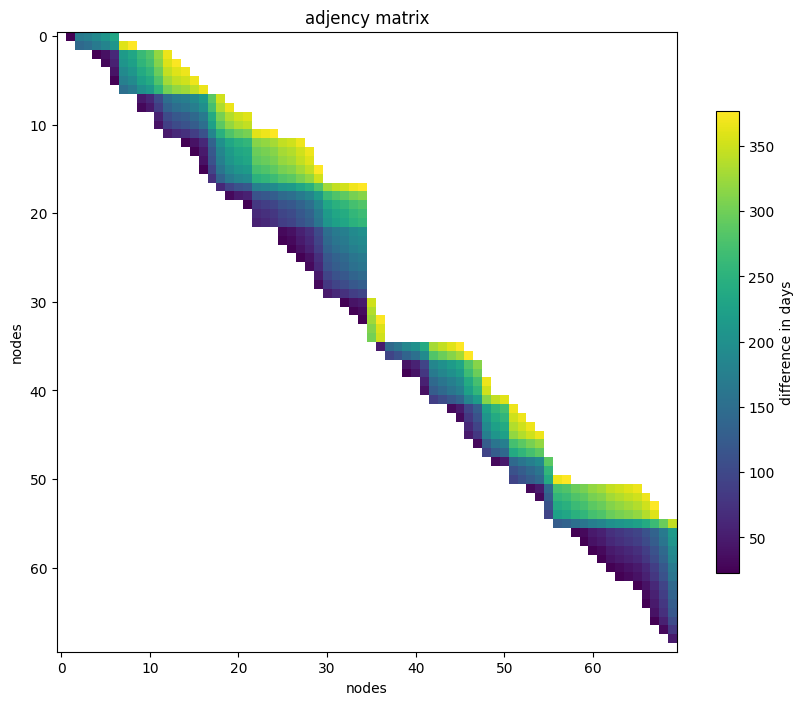

is strongly connected :  False
is weakly connected :  True
Avg Score: 1.03, Avg Cloud cover: 3.52, Avg Spatial res: 20.00, Avg nodata: 0.22, Avg Weight: 58.98, Std Dev Weight: 51.42


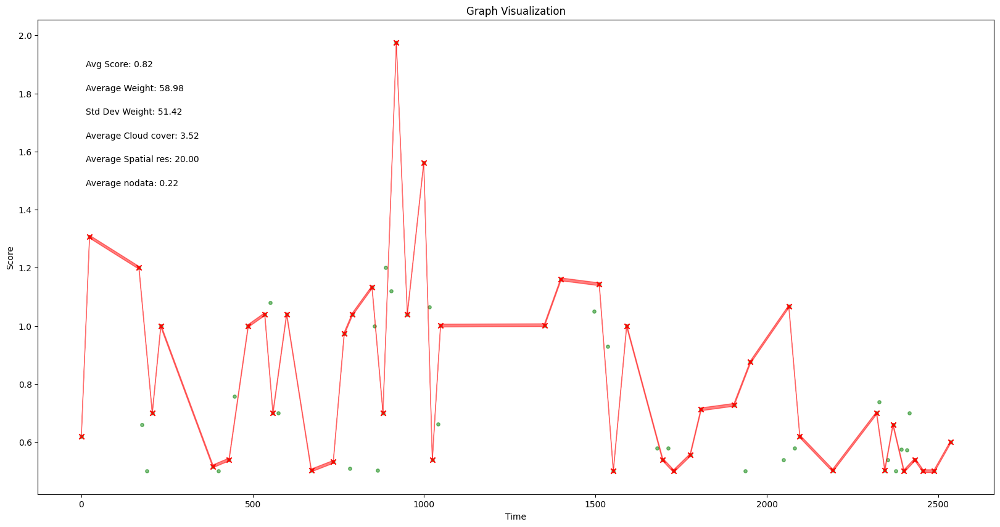

In [39]:
from datetime import datetime, timedelta, timezone

delta = timedelta(days=3*365)
row = table.iloc[0]
start_date = datetime(row.year, 1, 1, 10, 10, 10, tzinfo=timezone.utc) - delta
end_date = datetime(row.year, 12, 31, 10, 10, 10, tzinfo=timezone.utc) + delta
chr = Chronos(delta_min=20, cc1=5, cc2=75, buffer=3000, verbose=2, n_jobs=8, prefer='threads')

items, _, _, _ = chr.research(row.geometry, start_date, end_date)

## qa band Landsat-7

In [44]:
(qa == 1).mean()

0.0048911399213383685

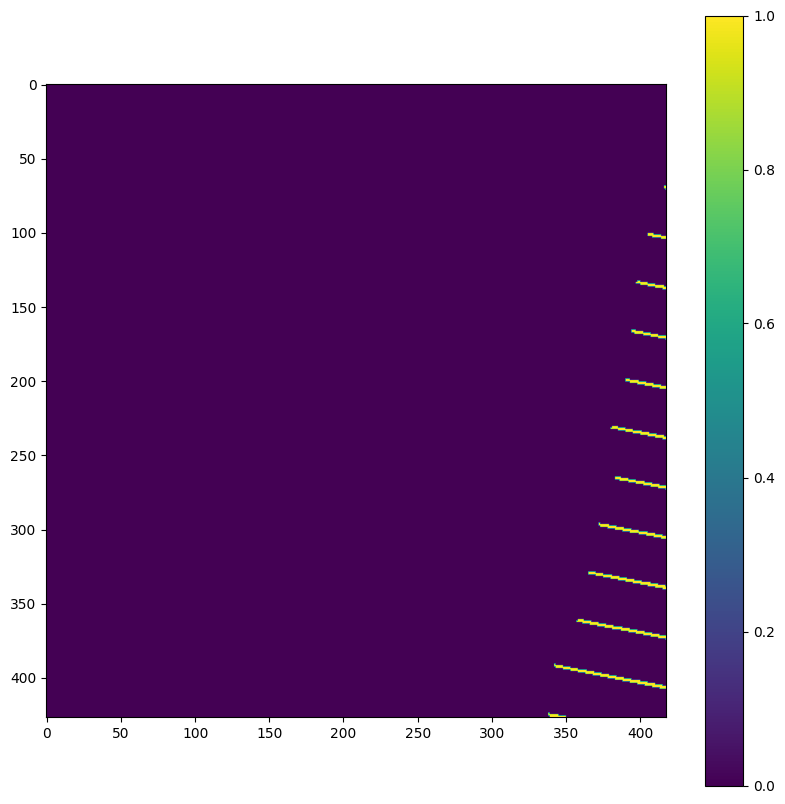

In [41]:
from rasterio.warp import transform_geom
from shapely.geometry import shape
import matplotlib.pyplot as plt
item = items[0]
geo = transform_geom('epsg:3857', 'epsg:4326', shape(row.geometry).convex_hull.buffer(3000))
crs, transfo, qa, _ = item.assets.crop_as_array('QA_PIXEL', bbox= shape(geo).bounds)
plt.figure(figsize=(10,10))
plt.imshow(qa.squeeze() == 1)
plt.colorbar()

In [38]:
import numpy as np
np.unique(qa, return_counts=True)

(array([   1, 5440, 5504, 5696, 5896], dtype=uint16),
 array([   873, 155910,  21536,    106,     61]))

# Downlaod

In [49]:
%load_ext autoreload
%autoreload 2
from chronos import Chronos

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


['landsat-5', 'landsat-7']


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:    4.3s
[Parallel(n_jobs=8)]: Done 110 out of 110 | elapsed:   15.2s finished


Items found for research 1 with cc=10 : 68


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:    6.7s
[Parallel(n_jobs=8)]: Done 151 out of 151 | elapsed:   35.6s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


Items found for research 2 with cc=25 (on aoi) : 244


[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done  97 out of  97 | elapsed:   10.5s finished


Items found for combined research:  97
upper bound :  160.0


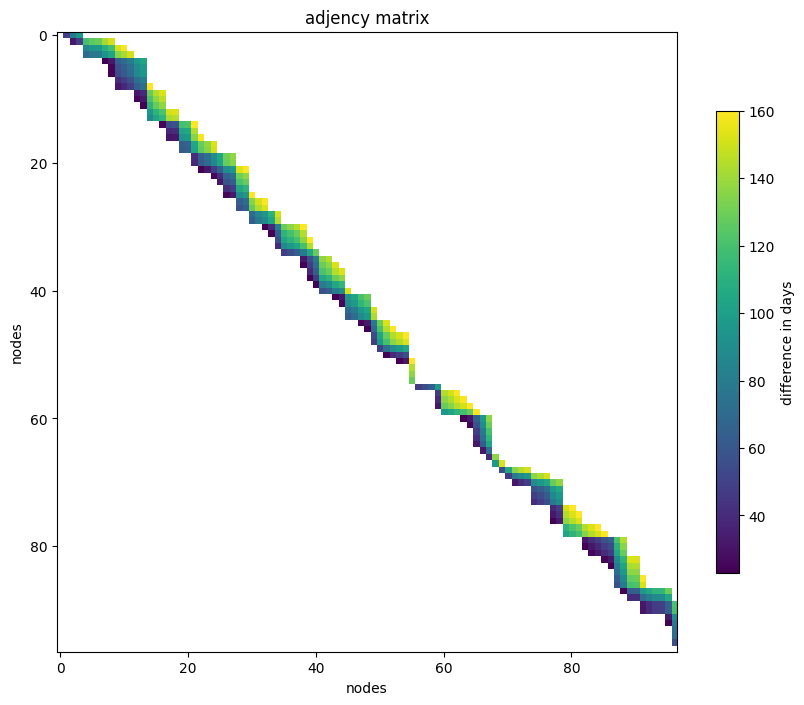

is strongly connected :  False
is weakly connected :  True
Avg Score: 1.14, Avg Cloud cover: 2.20, Avg Spatial res: 26.00, Avg nodata: 1.23, Avg Weight: 46.94, Std Dev Weight: 23.20


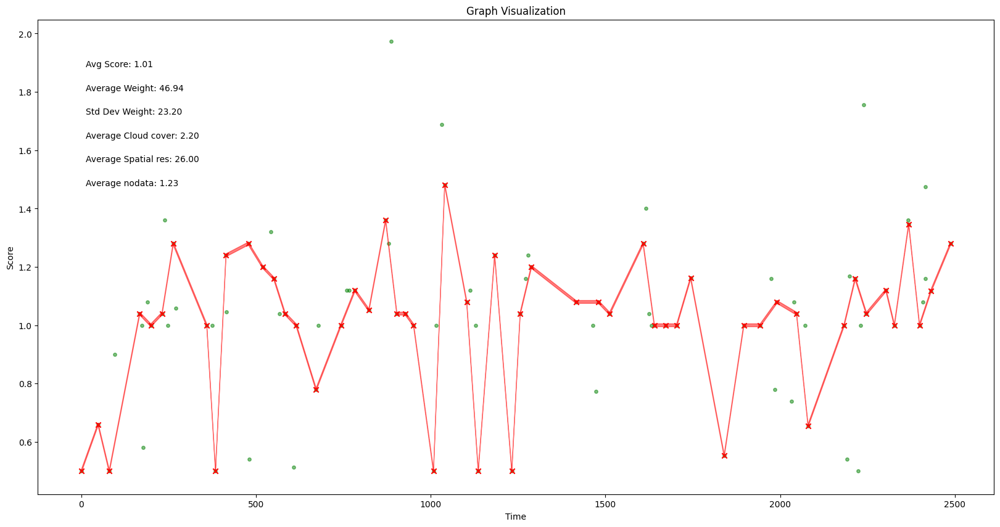

target: {'sat': 'landsat-7', 'band': 'pan', 'res': 15, 'crs': CRS.from_epsg(32632), 'transform': Affine(15.0, 0.0, 250657.5,
       0.0, -15.0, 4864462.5), 'shape': (324, 342)}
Starting download at:  /Users/arthurcalvi/Data/disturbances-ex/france/test_chronos_download_v4


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:   54.2s
[Parallel(n_jobs=8)]: Done  54 out of  54 | elapsed:  1.7min finished


In [50]:
from datetime import datetime, timedelta, timezone
delta = timedelta(days=3*365)
row = table.iloc[5]
start_date = datetime(row.year, 1, 1, 10, 10, 10, tzinfo=timezone.utc) - delta
end_date = datetime(row.year, 12, 31, 10, 10, 10, tzinfo=timezone.utc) + delta
chr = Chronos(delta_min=20, cc1=10, cc2=75, buffer=3000,
              pansharpening=True, sharpening=True, force_reproject=False, 
               normalization=None, verbose=2, n_jobs=8, prefer='threads')

dir_ = '/Users/arthurcalvi/Data/disturbances-ex/france'
name_folder = 'test_chronos_download_v4'
folder = os.path.join(dir_, name_folder)
results = chr.download(folder, row.geometry, start_date, end_date, indices=['rgb', 'evi', 'ndvi', 'nbr'])

# Conversion to Reflectance 

In [14]:
import json 
for item in items:
    try :
        metadata = json.loads(item.assets.download_as_str('MTL_JSON'))
        cst = metadata['LANDSAT_METADATA_FILE']['LEVEL2_SURFACE_REFLECTANCE_PARAMETERS']
        add = float(cst['REFLECTANCE_ADD_BAND_7'])
        mult = float(cst['REFLECTANCE_MULT_BAND_7'])
    except :
        pass 
    print(item.properties['platform'],': ', add, mult)

landsat-7 :  -0.2 2.75e-05
landsat-5 :  -0.2 2.75e-05
landsat-5 :  -0.2 2.75e-05
landsat-7 :  -0.2 2.75e-05
landsat-5 :  -0.2 2.75e-05
landsat-7 :  -0.2 2.75e-05
landsat-7 :  -0.2 2.75e-05
landsat-5 :  -0.2 2.75e-05
landsat-5 :  -0.2 2.75e-05
landsat-5 :  -0.2 2.75e-05
landsat-5 :  -0.2 2.75e-05
landsat-7 :  -0.2 2.75e-05
landsat-7 :  -0.2 2.75e-05
landsat-5 :  -0.2 2.75e-05
landsat-7 :  -0.2 2.75e-05
landsat-5 :  -0.2 2.75e-05
landsat-5 :  -0.2 2.75e-05
landsat-5 :  -0.2 2.75e-05
landsat-7 :  -0.2 2.75e-05
landsat-7 :  -0.2 2.75e-05
landsat-5 :  -0.2 2.75e-05
landsat-5 :  -0.2 2.75e-05
landsat-5 :  -0.2 2.75e-05
landsat-7 :  -0.2 2.75e-05
landsat-5 :  -0.2 2.75e-05
landsat-7 :  -0.2 2.75e-05
landsat-5 :  -0.2 2.75e-05
landsat-7 :  -0.2 2.75e-05
landsat-7 :  -0.2 2.75e-05
landsat-7 :  -0.2 2.75e-05
landsat-7 :  -0.2 2.75e-05
landsat-7 :  -0.2 2.75e-05
landsat-7 :  -0.2 2.75e-05
landsat-7 :  -0.2 2.75e-05
landsat-7 :  -0.2 2.75e-05
landsat-7 :  -0.2 2.75e-05
landsat-7 :  -0.2 2.75e-05
l

# Pan-sharpening

In [6]:
def norm(rgb):
    return (rgb - rgb.min())/(rgb.max() - rgb.min())

In [8]:
vmin=0
vmax=1

In [7]:
import json 
from pansharpening import pansharpen, histogram_match_pansharpen_visual
from chronos import config, dplatform
from shapely.geometry import shape
from rasterio.warp import reproject
from skimage.filters import unsharp_mask
from skimage.exposure import match_histograms
import numpy as np 
import rasterio


def get_asset(item, sat, band, bbox):

    crs, transfo, arr, _ = item.assets.crop_as_array(band, bbox = bbox)

    return crs, transfo, arr 

def rgb(item, sat, geometry, target=None, force_reproject=False, pansharpening=False, sharpening=True, resampling=rasterio.enums.Resampling.cubic):
    # try :
    crs, transfo, b = get_asset(item, sat, sat['rgb_bands'][0], shape(geometry).bounds)
    _, _, g = get_asset(item, sat, sat['rgb_bands'][1], shape(geometry).bounds)
    _, _, r = get_asset(item, sat, sat['rgb_bands'][2], shape(geometry).bounds)

    #Conv to reflectance
    arr = sat['reflectance'](np.stack([r.squeeze(),g.squeeze(),b.squeeze()], axis=0)) 
    r_arr = arr.copy()

    #Pansharpening (optional)
    if pansharpening and sat['pan'] is not None:
        arr, transfo, pansharpening = get_pansharpened(item, config, arr, transfo, geometry)

    #Reporjection 
    if (target is not None and sat['resolution'][sat['rgb_bands'][0]] > target['res']) or force_reproject:
        arr, transfo = reproject(arr, destination=np.zeros((arr.shape[0],*target['shape'])), src_transform=transfo, src_crs=crs, dst_transform=target['transform'], dst_crs=target['crs'], resampling=resampling)
        crs = target['crs']

        #sharpening
        if sharpening and 'landsat' in dplatform[item.properties['platform']].lower():
            if pansharpening:
                radius = 1.5
                amount = 1.
            else:
                radius = 3.
                amount = 1. 

            arr = unsharp_mask(arr, radius=radius, amount=amount)

        #histogram matching
        arr = match_histograms(arr, r_arr, channel_axis=0)

    return crs, transfo, arr

    # except:
    #     return None, None, None
    
def get_pansharpened(item, config, arr, transfo, geometry_buffer):
    sat = dplatform[item.properties['platform']]
    collection = config[sat]['pan']['collection']

    try :
        item_pan = collection.get_item( item.id.replace(config[sat]['pan']['from'], config[sat]['pan']['to']) )
        #cst
        metadata = json.loads(item_pan.assets.download_as_str('MTL_JSON'))
        cst = metadata['LANDSAT_METADATA_FILE']['LEVEL1_RADIOMETRIC_RESCALING']
        add = float(cst['REFLECTANCE_ADD_BAND_8'])
        mult = float(cst['REFLECTANCE_MULT_BAND_8'])
        pan = item_pan.assets.crop_as_array(config[sat]['pan']['pan_band'], bbox= shape(geometry_buffer).bounds)
        pan = (mult * (pan[2].squeeze()) + add) 
        #pan-sharpening
        pansharpened = pansharpen(arr, pan, method='pca',interpolation_order=3 ,with_nir=False)
        transfo = transfo * transfo.scale((arr.shape[1] / pansharpened.shape[1]),\
                                        (arr.shape[2] / pansharpened.shape[2]))
        pansharpened = histogram_match_pansharpen_visual(pansharpened, arr)
        return pansharpened, transfo, True
    except:
        return arr, transfo, False

In [9]:
from shapely.geometry import shape
from rasterio.warp import transform_geom

buffer = 3000
item = items[10]
geometry_buffer = transform_geom('epsg:3857', 'epsg:4326', shape(row.geometry).convex_hull.buffer(buffer))
sat = config[dplatform[item.properties['platform']]]
crs, transfo, arr = rgb(item, sat, geometry_buffer)
arr = arr.clip(0,1)
print(transfo)
print(arr.shape)
old_arr = arr.copy()

| 30.00, 0.00, 272835.00|
| 0.00,-30.00, 4858155.00|
| 0.00, 0.00, 1.00|
(3, 206, 190)


In [11]:
import matplotlib.pyplot as plt
arr_, transfo, _ = get_pansharpened(item, config, arr, transfo, geometry_buffer)
print(arr_.shape, arr_.dtype)

(3, 411, 379) float64


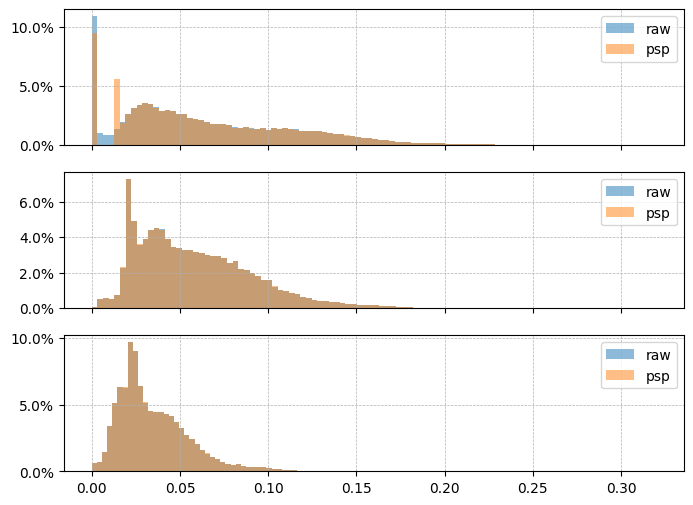

In [12]:
fig, axes = plt.subplots(3,1, figsize=(8,6), sharex=True)
from matplotlib.ticker import PercentFormatter
for i in range(len(axes)):
    a = old_arr[i].reshape(-1)
    b = arr_[i].reshape(-1)
    axes[i].hist(a, bins=100, alpha=0.5, label='raw', weights=np.ones(len(a)) / len(a))
    axes[i].hist(b, bins=100, alpha=0.5, label='psp', weights=np.ones(len(b)) / len(b))

for ax in axes:
    ax.yaxis.set_major_formatter(PercentFormatter(1))
    ax.legend()
    ax.grid(True, linestyle='--', lw=0.5)


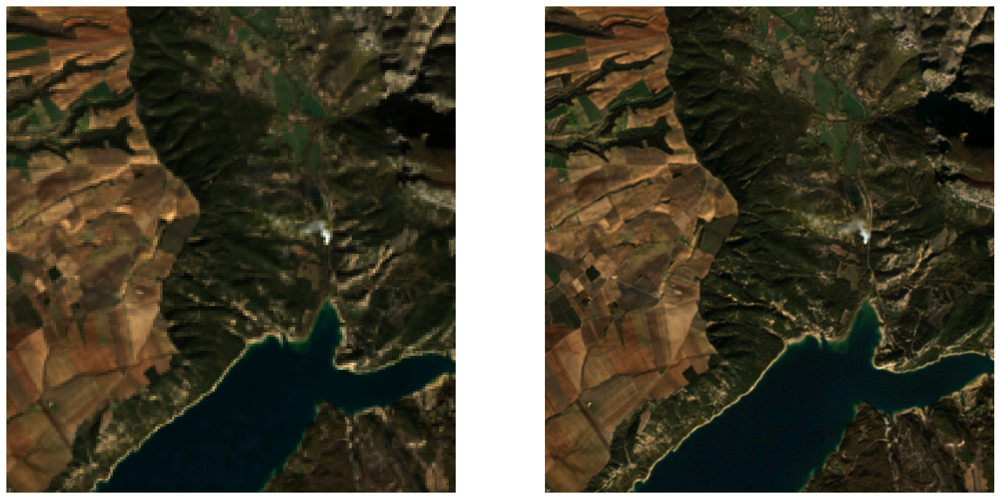

In [13]:
fig, axes = plt.subplots(1,2, figsize=(20,10))
axes[0].imshow(norm(old_arr.transpose(1,2,0)) )
axes[1].imshow(norm(arr_.transpose(1,2,0)) )
for ax in axes:
    ax.set_axis_off()

il faut faire la conversion en TOA reflectance -> https://semiautomaticclassificationmanual.readthedocs.io/en/latest/thematic_tutorial_image_conversion.html

# Sharpening

In [9]:
#find uniform target
from shapely.geometry import shape
from rasterio.warp import transform_geom
import numpy as np
from chronos import dplatform, config

buffer = 3000
geometry_buffer = transform_geom('epsg:3857', 'epsg:4326', shape(row.geometry).convex_hull.buffer(buffer))
target = {'sat':None, 'band':None, 'res':100, 'crs':None, 'transform':None, 'shape':None}
sat = chr.sats[0]
for sat in chr.sats:
    res = min(config[sat]['resolution'].values())
    if res < target['res']:
        target['res'] = res
        target['band'] = min(config[sat]['resolution'], key=config[sat]['resolution'].get)
        target['sat'] = sat


item_target = [item for item in items if dplatform[item.properties['platform']] == target['sat']][0]
print(shape(geometry_buffer).bounds)
print(target)
crs_target, transfo_target, arr_target, _ = item_target.assets.crop_as_array(target['band'], bbox= shape(geometry_buffer).bounds)

target['crs'] = crs_target
target['transform'] = transfo_target
target['shape'] = arr_target.squeeze().shape
target

(4.083702414940937, 44.17443841808809, 4.1446789911067015, 44.21998122778245)
{'sat': 'sentinel-2', 'band': 'B02', 'res': 10, 'crs': None, 'transform': None, 'shape': None}


{'sat': 'sentinel-2',
 'band': 'B02',
 'res': 10,
 'crs': CRS.from_epsg(32631),
 'transform': Affine(10.0, 0.0, 586560.0,
        0.0, -10.0, 4896950.0),
 'shape': (514, 495)}

## Reprojection

/Users/arthurcalvi/Venv/Download/lib/python3.9/site-packages/skimage/filters/_unsharp_mask.py:11: FutureWarning: Automatic detection of the color channel was deprecated in v0.19, and `channel_axis=None` will be the new default in v0.21. Set `channel_axis=-1` explicitly to silence this warning.
  blurred = gaussian(image, sigma=radius, mode='reflect')


Text(0.5, 0.98, 'Reprojection')

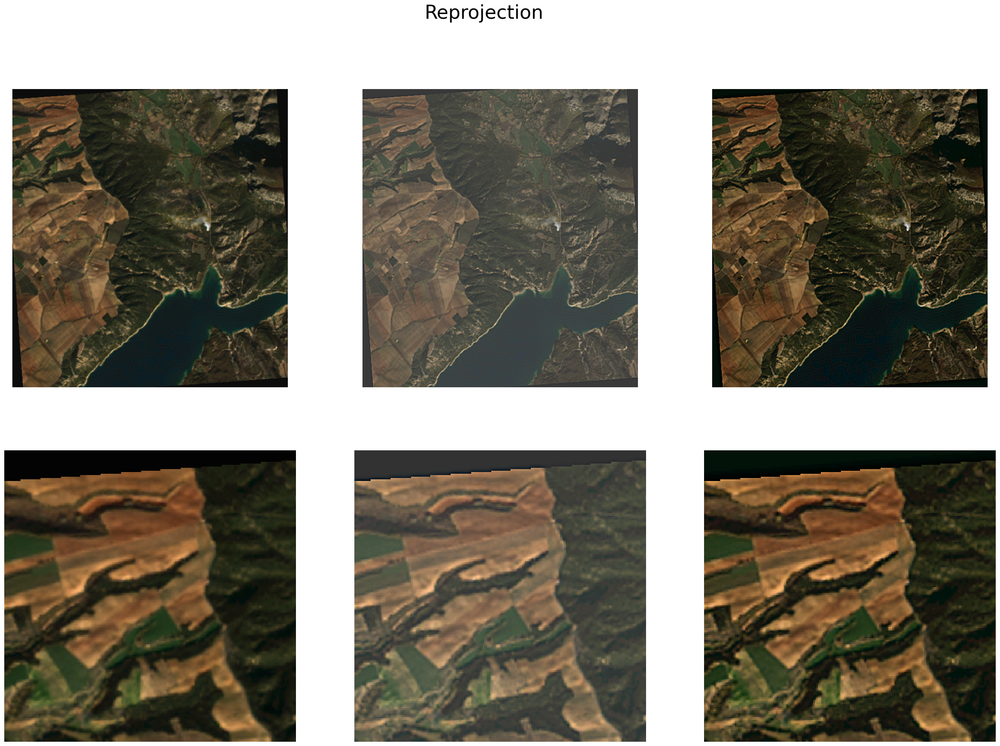

In [15]:
from skimage.filters import unsharp_mask
from skimage.transform import resize

r_arr, r_transfo = reproject(arr_, destination=np.zeros((arr_.shape[0],*target['shape'])),\
                              src_transform=transfo, src_crs=crs, dst_transform=target['transform'], \
                                  dst_crs=target['crs'], resampling=rasterio.enums.Resampling.cubic)
r_arr = r_arr.transpose(1,2,0)
rgb_s = unsharp_mask(r_arr, radius=1.5, amount=1)
rgb_smh = match_histograms(rgb_s, old_arr.transpose(1,2,0), channel_axis=2)
fig, axes = plt.subplots(2,3, figsize=(30,20))
axes[0,0].imshow(norm(r_arr), vmin=vmin, vmax=vmax)
axes[0,1].imshow(norm(rgb_s), vmin=vmin, vmax=vmax)
axes[0,2].imshow(norm(rgb_smh), vmin=vmin, vmax=vmax)
axes[1,0].imshow(norm(r_arr[:200, :200]), vmin=vmin, vmax=vmax)
axes[1,1].imshow(norm(rgb_s[:200, :200]), vmin=vmin, vmax=vmax)
axes[1,2].imshow(norm(rgb_smh[:200, :200]), vmin=vmin, vmax=vmax)
for r in axes:
    for c in r:
        c.set_axis_off()

fig.suptitle('Reprojection', fontsize=32)

Text(0.5, 0.98, 'Reprojection')

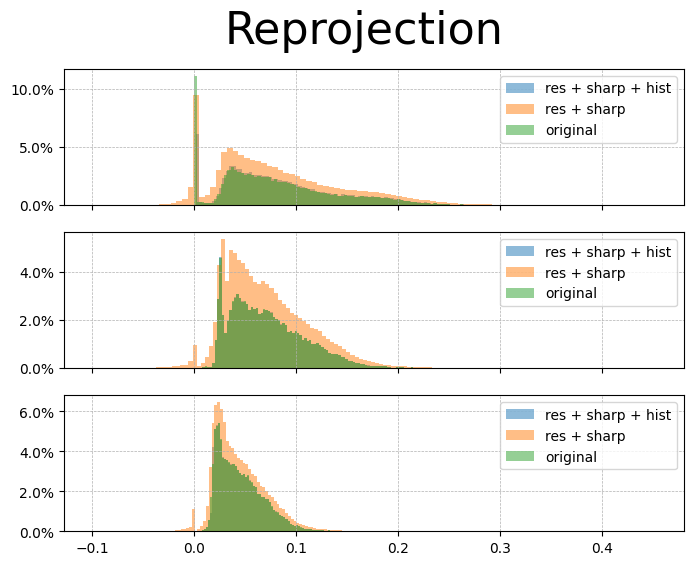

In [42]:
fig, axes = plt.subplots(3,1, figsize=(8,6), sharex=True)
from matplotlib.ticker import PercentFormatter
for i in range(len(axes)):
    a = rgb_smh[:,:,i].reshape(-1) 
    a = a[ a != 0]
    b = rgb_s[:,:,i].reshape(-1)
    b = b[ b != 0]
    o = old_arr[i].reshape(-1)
    axes[i].hist(a, bins=100, alpha=0.5, label='res + sharp + hist', weights=np.ones(len(a)) / len(a))
    axes[i].hist(b, bins=100, alpha=0.5, label='res + sharp', weights=np.ones(len(b)) / len(b))
    axes[i].hist(o, bins=100, alpha=0.5, label='original', weights=np.ones(len(o)) / len(o))

for ax in axes:
    ax.yaxis.set_major_formatter(PercentFormatter(1))
    ax.legend()
    ax.grid(True, linestyle='--', lw=0.5)

fig.suptitle('Reprojection', fontsize=32)

## Resize

Text(0.5, 0.98, 'Resize')

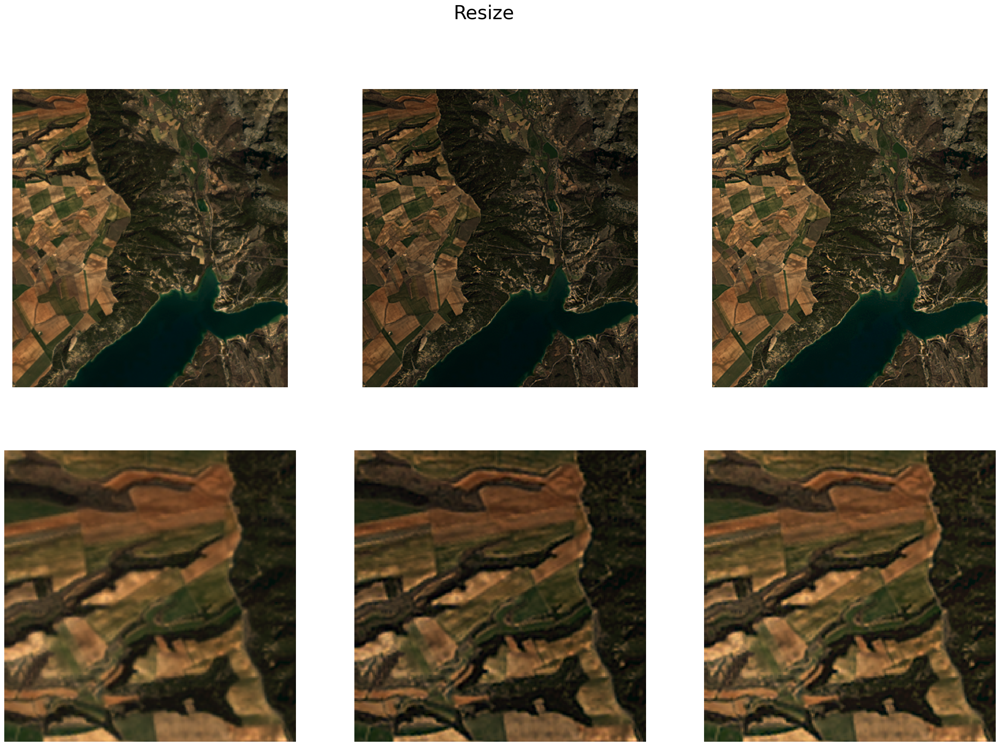

In [43]:
from skimage.filters import unsharp_mask
from skimage.transform import resize
from skimage.exposure import match_histograms

r_arr = resize(arr_.transpose(1,2,0), (*target['shape'], arr.shape[0]), order=3, clip=True, preserve_range=True, anti_aliasing=False)
rgb_s = unsharp_mask(r_arr, radius=1.5, amount=1)
rgb_smh = match_histograms(rgb_s, old_arr.transpose(1,2,0), channel_axis=2)
fig, axes = plt.subplots(2,3, figsize=(30,20))
axes[0,0].imshow(norm(r_arr), vmin=vmin, vmax=vmax)
axes[0,1].imshow(norm(rgb_s), vmin=vmin, vmax=vmax)
axes[0,2].imshow(norm(rgb_smh), vmin=vmin, vmax=vmax)
axes[1,0].imshow(norm(r_arr[:200, :200]), vmin=vmin, vmax=vmax)
axes[1,1].imshow(norm(rgb_s[:200, :200]), vmin=vmin, vmax=vmax)
axes[1,2].imshow(norm(rgb_smh[:200, :200]), vmin=vmin, vmax=vmax)
for r in axes:
    for c in r:
        c.set_axis_off()

fig.suptitle('Resize', fontsize=32)

Text(0.5, 0.98, 'Resize')

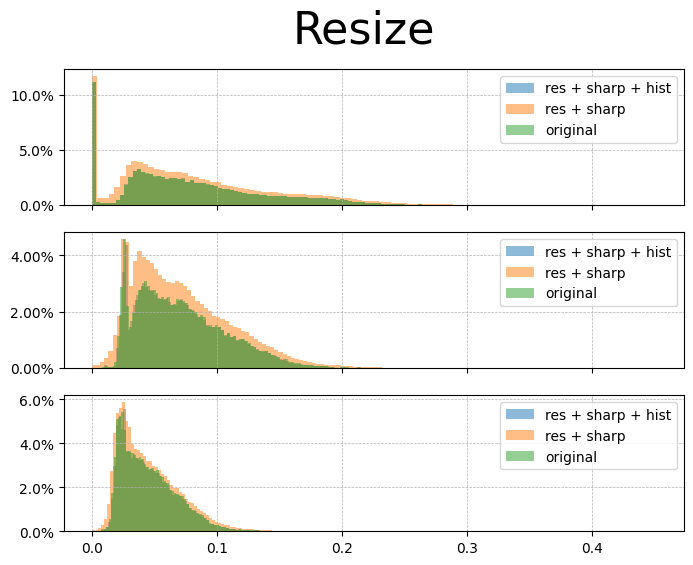

In [44]:
fig, axes = plt.subplots(3,1, figsize=(8,6), sharex=True)
from matplotlib.ticker import PercentFormatter
for i in range(len(axes)):
    a = rgb_smh[:,:,i].reshape(-1) 
    b = rgb_s[:,:,i].reshape(-1)
    o = old_arr[i].reshape(-1)
    axes[i].hist(a, bins=100, alpha=0.5, label='res + sharp + hist', weights=np.ones(len(a)) / len(a))
    axes[i].hist(b, bins=100, alpha=0.5, label='res + sharp', weights=np.ones(len(b)) / len(b))
    axes[i].hist(o, bins=100, alpha=0.5, label='original', weights=np.ones(len(o)) / len(o))

for ax in axes:
    ax.yaxis.set_major_formatter(PercentFormatter(1))
    ax.legend()
    ax.grid(True, linestyle='--', lw=0.5)

fig.suptitle('Resize', fontsize=32)

## Resize and reprojection

Text(0.5, 0.98, 'Resize')

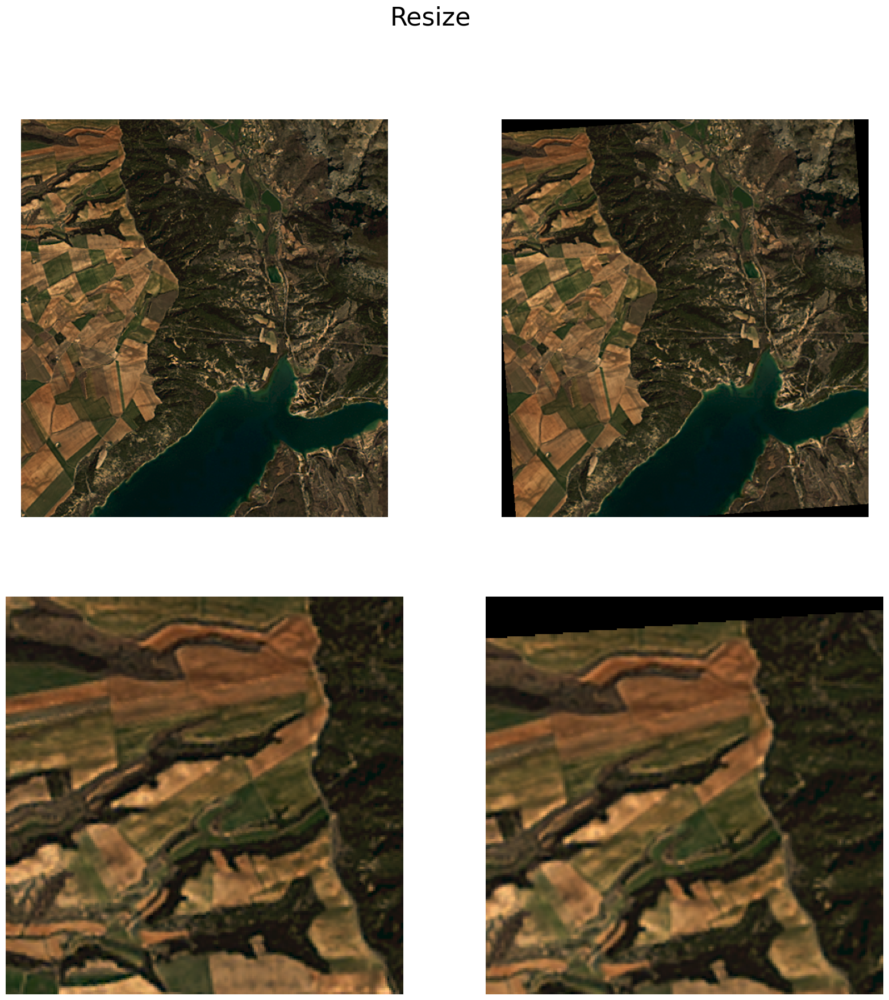

In [45]:
from skimage.filters import unsharp_mask
from skimage.transform import resize
from skimage.exposure import match_histograms

r_arr = resize(arr_.transpose(1,2,0), (*target['shape'], arr.shape[0]), order=3, clip=True, preserve_range=True, anti_aliasing=False)
rgb_s = unsharp_mask(r_arr, radius=1.5, amount=1)
rgb_smh = match_histograms(rgb_s, old_arr.transpose(1,2,0), channel_axis=2).transpose(2,0,1)

transfo_n = transfo * transfo.scale((arr_.shape[1] / rgb_smh.shape[1]),\
                                        (arr_.shape[2] / rgb_smh.shape[2]))
r_arr_p, r_transfo_p = reproject(rgb_smh, destination=np.zeros((rgb_smh.shape[0],*target['shape'])),\
                              src_transform=transfo_n, src_crs=crs, dst_transform=target['transform'], \
                                  dst_crs=target['crs'], resampling=rasterio.enums.Resampling.bilinear)



fig, axes = plt.subplots(2,2, figsize=(20,20))
axes[0,0].imshow(norm(rgb_smh.transpose(1,2,0)), vmin=vmin, vmax=vmax)
axes[0,1].imshow(norm(r_arr_p.transpose(1,2,0)), vmin=vmin, vmax=vmax)
axes[1,1].imshow(norm(r_arr_p.transpose(1,2,0)[:200, :200]), vmin=vmin, vmax=vmax)
axes[1,0].imshow(norm(rgb_smh.transpose(1,2,0)[:200, :200]), vmin=vmin, vmax=vmax)
for r in axes:
    for c in r:
        c.set_axis_off()

fig.suptitle('Resize', fontsize=32)

Text(0.5, 0.98, 'Resize')

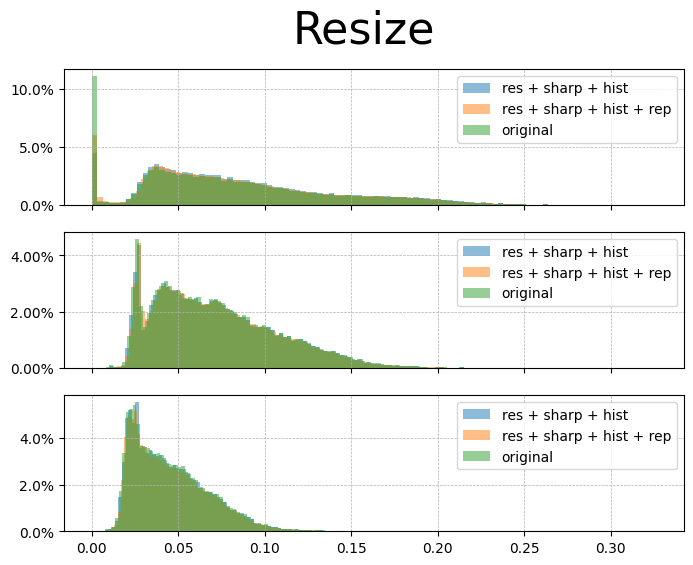

In [46]:
fig, axes = plt.subplots(3,1, figsize=(8,6), sharex=True)
from matplotlib.ticker import PercentFormatter
for i in range(len(axes)):
    a = rgb_smh[i].reshape(-1) 
    a = a[a!=0]
    b = r_arr_p[i].reshape(-1)
    b = b[b!=0]
    o = old_arr[i].reshape(-1)
    axes[i].hist(a, bins=100, alpha=0.5, label='res + sharp + hist', weights=np.ones(len(a)) / len(a))
    axes[i].hist(b, bins=100, alpha=0.5, label='res + sharp + hist + rep', weights=np.ones(len(b)) / len(b))
    axes[i].hist(o, bins=100, alpha=0.5, label='original', weights=np.ones(len(o)) / len(o))

for ax in axes:
    ax.yaxis.set_major_formatter(PercentFormatter(1))
    ax.legend()
    ax.grid(True, linestyle='--', lw=0.5)

fig.suptitle('Resize + reproject', fontsize=32)

## Comparison

/Users/arthurcalvi/Venv/Download/lib/python3.9/site-packages/skimage/filters/_unsharp_mask.py:11: FutureWarning: Automatic detection of the color channel was deprecated in v0.19, and `channel_axis=None` will be the new default in v0.21. Set `channel_axis=-1` explicitly to silence this warning.
  blurred = gaussian(image, sigma=radius, mode='reflect')


reprojection:  0.3113398551940918
resize+reprojection:  0.7288169860839844


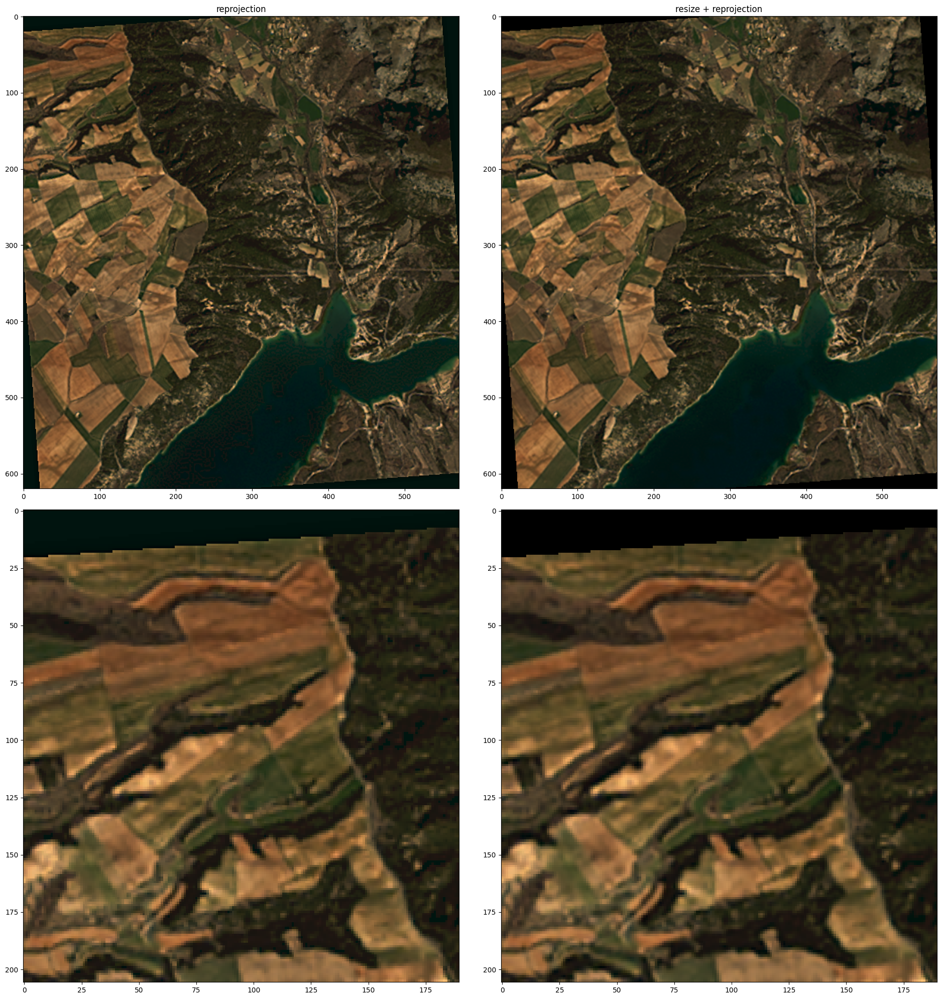

In [62]:
from time import time
order = 3

#reprojection 
start = time()
r_arr, r_transfo = reproject(arr_, destination=np.zeros((arr_.shape[0],*target['shape'])),\
                              src_transform=transfo, src_crs=crs, dst_transform=target['transform'], \
                                  dst_crs=target['crs'], resampling=rasterio.enums.Resampling.cubic)
r_arr = r_arr.transpose(1,2,0)
rgb_s = unsharp_mask(r_arr, radius=1.5, amount=1)
r_arr_r = match_histograms(rgb_s, old_arr.transpose(1,2,0), channel_axis=2)
end = time()
print('reprojection: ', end-start)

#resize + reproject
start = time()
r_arr = resize(arr_.transpose(1,2,0), (*target['shape'], arr.shape[0]), order=2, clip=True, preserve_range=True, anti_aliasing=False)
rgb_s = unsharp_mask(r_arr, radius=1.5, amount=1)
rgb_smh = match_histograms(rgb_s, old_arr.transpose(1,2,0), channel_axis=2).transpose(2,0,1)

transfo_n = transfo * transfo.scale((arr_.shape[1] / rgb_smh.shape[1]),\
                                        (arr_.shape[2] / rgb_smh.shape[2]))
r_arr_rp, r_transfo_p = reproject(rgb_smh, destination=np.zeros((rgb_smh.shape[0],*target['shape'])),\
                              src_transform=transfo_n, src_crs=crs, dst_transform=target['transform'], \
                                  dst_crs=target['crs'], resampling=rasterio.enums.Resampling.bilinear)

r_arr_rp = r_arr_rp.transpose(1,2,0)
end = time()
print('resize+reprojection: ', end-start)

fig, axes = plt.subplots(2,2, figsize=(20,20), tight_layout=True)

x = r_arr_r.shape[0] // 3
y = r_arr_r.shape[1] // 3
axes[0,0].set_title('reprojection')
axes[0,0].imshow(norm(r_arr_r), vmin=vmin, vmax=vmax)
axes[1,0].imshow(norm(r_arr_r[:x, :y]), vmin=vmin, vmax=vmax)

axes[0,1].set_title('resize + reprojection')
axes[0,1].imshow(norm(r_arr_rp), vmin=vmin, vmax=vmax)
axes[1,1].imshow(norm(r_arr_rp[:x, :y]), vmin=vmin, vmax=vmax)


## Viz

In [16]:
from shapely.geometry import shape
from rasterio.warp import transform_geom

buffer = 3000
item = items[10]
geometry_buffer = transform_geom('epsg:3857', 'epsg:4326', shape(row.geometry).convex_hull.buffer(buffer))
sat = config[dplatform[item.properties['platform']]]
crs, transfo, arr = rgb(item, sat, geometry_buffer)
arr = arr.clip(0,1)
print(transfo)
print(arr.shape)
old_arr = arr.copy()

| 30.00, 0.00, 272835.00|
| 0.00,-30.00, 4858155.00|
| 0.00, 0.00, 1.00|
(3, 206, 190)


In [17]:
import matplotlib.pyplot as plt
arr_, transfo, _ = get_pansharpened(item, config, arr, transfo, geometry_buffer)

In [63]:
old_arr.shape

(206, 190, 3)

In [44]:
rgb_s.shape

(3, 618, 570)

In [38]:
old_arr.shape

(3, 206, 190)

In [46]:
from skimage.filters import unsharp_mask
from skimage.transform import resize
from skimage.exposure import match_histograms

r_arr = resize(arr_, (arr.shape[0], old_arr.shape[1]*3, old_arr.shape[2]*3 ), order=3, clip=True, preserve_range=True, anti_aliasing=False)
rgb_s = unsharp_mask(r_arr, radius=1.5, amount=1)
rgb_smh = match_histograms(rgb_s, old_arr, channel_axis=0)

In [47]:
old_arr.shape

(3, 206, 190)

In [49]:
arr_.shape

(3, 411, 379)

In [48]:
rgb_smh.shape

(3, 618, 570)

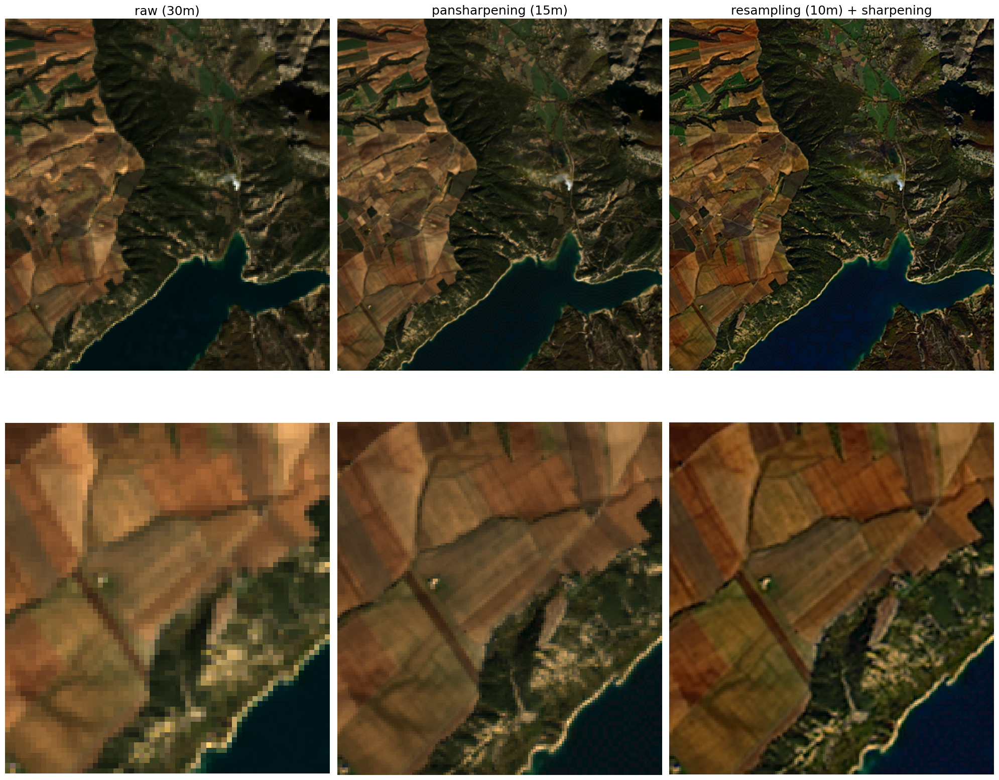

In [51]:
fig, axes = plt.subplots(2,3, figsize=(20,20), tight_layout=True)

old_arr = old_arr.transpose(1,2,0)
arr_ = arr_.transpose(1,2,0)
rgb_smh = rgb_smh.transpose(1,2,0)
x1 = old_arr.shape[0] // 3
y1 = old_arr.shape[1] // 3
x2 = arr_.shape[0] // 3
y2 = arr_.shape[1] // 3
x3 = rgb_smh.shape[0] // 3
y3 = rgb_smh.shape[1] // 3
axes[0,0].set_title('raw (30m)', size=18)
axes[0,0].imshow(norm(old_arr), vmin=vmin, vmax=vmax)
axes[1,0].imshow(norm(old_arr[-x1:, :y1]), vmin=vmin, vmax=vmax)

axes[0,1].set_title('pansharpening (15m)', size=18)
axes[0,1].imshow(norm(arr_), vmin=vmin, vmax=vmax)
axes[1,1].imshow(norm(arr_[-x2:, :y2]), vmin=vmin, vmax=vmax)

axes[0,2].set_title('resampling (10m) + sharpening', size=18)
axes[0,2].imshow(norm(rgb_smh), vmin=vmin, vmax=vmax)
axes[1,2].imshow(norm(rgb_smh[-x3:, :y3]), vmin=vmin, vmax=vmax)
for r in axes:
    for c in r:
        c.set_axis_off()

In [82]:
fig.savefig('processing_L8.jpeg', dpi=250)

# Resampling

In [52]:
import rasterio
    
def write_tif(arr, transfo, crs, direction, item, dtype='uint16', normalization=True):
    pr  = {
            'transform': transfo,
            'crs': crs,
            'width': arr.shape[2],
            'height': arr.shape[1],
            'count': arr.shape[0],
            'dtype': dtype, 
            'driver': 'GTiff'
            
        }
    
    arr = arr.clip(0,1)
    if normalization is not None:
        arr = ((arr - normalization[0]) /  (normalization[1]- normalization[0])).clip(0,1)

    if dtype == 'uint16':
        arr *= 65535
    elif dtype == 'uint8':
        arr *= 255 


    name = '{}_{}.tif'.format(item.properties['datetime'].strftime("%Y-%m-%d_%H%M%S"), item.properties['platform'])
    with rasterio.open(os.path.join(direction, name),'w', **pr) as ff:
        ff.write(arr)
        
def get_image(item, sat, geometry, disturbance, folder,  target=None, indices=False, force_reproject=False, pansharpening=False, sharpening=True, normalization=True):

    #rgb 
    sub_folder = 'rgb'
    crs, transfo, arr = rgb(item, sat, geometry, target, force_reproject=force_reproject, pansharpening=pansharpening, sharpening=sharpening)

    if arr is None :
        return None
    else :
        arr[:, disturbance == 1] = 150 
        direction = os.path.join(folder, sub_folder)
        os.makedirs(direction, exist_ok=True)
        write_tif(arr, transfo, crs, direction, item, normalization=normalization)

    # if indices:
    #     for indice in dfunc:
    #         sub_folder = indice
    #         arr, transfo, crs = dfunc[indice](item, sat, geometry)
    #         if arr is None :
    #             return None
    #         else :
    #             arr[:, disturbance == 1] = 150 
    #             write_tif(arr, transfo, crs, sub_folder, item)


In [12]:
from joblib import Parallel, delayed
from rasterio.features import rasterize
from chronos import config

dir_ = '/Users/arthurcalvi/Data/disturbances-ex/france'
name_folder = 'test_chronos_pansharpening_sharpening_normF'
folder = os.path.join(dir_, name_folder)
crs, transfo, arr = rgb(item_target, config[dplatform[item_target.properties['platform']]], shape(geometry_buffer).envelope)
disturbance = rasterize([transform_geom('epsg:3857', crs, row.geometry.buffer(100).convex_hull.boundary)], out_shape = arr.shape[1:], transform=transfo, fill=np.nan, all_touched=False)
results = Parallel(n_jobs=6, prefer='threads', verbose=5)(delayed(get_image)(item, config[dplatform[item.properties['platform']]], shape(geometry_buffer).envelope, disturbance, folder,\
                                                                              target, force_reproject=False, pansharpening=True, normalization=False) for item in items)

[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   6 tasks      | elapsed:   11.2s
[Parallel(n_jobs=6)]: Done  66 out of  66 | elapsed:  1.4min finished


# Test indices

In [60]:
from skimage.transform import resize

dfunc = {
    'rgb': lambda x: x[[2,1,0], :, :], 
    'ndvi' : lambda x: (x[0] - x[1]) / (x[0] + x[1]).clip(-1, 1) / 2 + 0.5,
    'nbr' : lambda x: (x[0] - x[1]) / (x[0] + x[1]).clip(-1, 1) / 2 + 0.5,
    'evi' : lambda x: 2.5 * (x[0] - x[1]) / (x[0] + 6. * x[1] - 7.5 * x[2] + 1).clip(-1, 1) / 2 + 0.5,
}

def check_transfo_crs(ibands):
    itransfo = [x[1] for x in ibands]
    icrs = [x[0] for x in ibands]
    return (itransfo.count(itransfo[0]) == len(itransfo)) * (icrs.count(icrs[0]) == len(icrs))

def get_indices(item, config_sat, geometry, indices=['rgb'], target=None, aoi=None, \
                force_reproject=False, pansharpening=True, sharpening=True, normalization=None):

    #retrieve bands
    bands = []
    for indice in indices:
        bands.extend(config_sat["_".join([indice, 'bands'])])
    bands = set(bands)

    #download bands
    dbands = dict()
    for key in bands:
        dbands[key] = get_asset(item, config_sat, key, shape(geometry).bounds)

    #compute indices
    for indice in indices:
        ibands = [ dbands[key] for key in config_sat["_".join([indice, 'bands'])] ]
        #same spatial resolution and same crs 
        if check_transfo_crs(ibands):
            pass
        else :
            index_pre_target = np.argmax([ band[2].shape[1:] for band in ibands])
            pt_crs, pt_transfo, pt_arr = ibands[index_pre_target]
            ## scale all bands and then stack and preprocessing
            for i in range(len(ibands)):
                if i != index_pre_target:
                    arr = resize(ibands[i][2], pt_arr.shape, preserve_range=True, order=3)
                    ibands[i] = (ibands[i][0], pt_transfo, arr)
            pass

        crs = ibands[0][0]
        transfo = ibands[0][1]
        arr = np.stack([b[2].squeeze() for b in ibands], axis=0)
        #preprocessing (PanSharpening, Sharpening, Reprojecting, Histogram Matching)
        crs, transfo, arr = preprocessing(crs, transfo, arr, item, config_sat, geometry, target=target,\
                                            force_reproject=force_reproject, pansharpening=pansharpening, sharpening=sharpening)
        
        #computing indice :
        arr = dfunc[indice](arr)

        #writing 
        if arr is not None:
            if aoi is not None:
                if len(arr.shape) == 2:
                    arr = np.expand_dims(arr, axis=0)
                arr[:, aoi == 1] = 150 
            direction = os.path.join(folder, indice)
            os.makedirs(direction, exist_ok=True)
            write_tif(arr, transfo, crs, direction, item, normalization=normalization)


def preprocessing(crs, transfo, arr, item, config_sat, geometry, target=None, force_reproject=False, pansharpening=False, sharpening=True):
    #Conv to reflectance
    arr = config_sat['reflectance'](arr) 

    #Calibration reflectance 
    if target is not None:
        pass 
        ## TO DO r_arr = 

    r_arr = arr.copy()

    #Pansharpening (optional)
    if pansharpening and config_sat['pan'] is not None:
        arr, transfo, pansharpening = get_pansharpened(item, config, arr, transfo, geometry)

    #Reporjection 
    if target is not None and (config_sat['resolution'][config_sat['rgb_bands'][0]] > target['res'] or force_reproject):
        arr, transfo = reproject(arr, destination=np.zeros((arr.shape[0],*target['shape'])),\
                                  src_transform=transfo, src_crs=crs, dst_transform=target['transform'], dst_crs=target['crs'], \
                                    resampling=rasterio.enums.Resampling.cubic)
        crs = target['crs']

        #sharpening
        if sharpening and 'landsat' in dplatform[item.properties['platform']].lower():
            if pansharpening:
                radius = 1.5
                amount = 1.
            else:
                radius = 3.
                amount = 1. 

            arr = unsharp_mask(arr, radius=radius, amount=amount)

        #histogram matching
        arr = match_histograms(arr, r_arr, channel_axis=0)

    return crs, transfo, arr


In [61]:
from joblib import Parallel, delayed
from rasterio.features import rasterize
from chronos import config

dir_ = '/Users/arthurcalvi/Data/disturbances-ex/france'
name_folder = 'test3_chronos_indices_psp_sh_normF'
folder = os.path.join(dir_, name_folder)
crs, transfo, arr = rgb(item_target, config[dplatform[item_target.properties['platform']]], shape(geometry_buffer).envelope)
disturbance = rasterize([transform_geom('epsg:3857', crs, row.geometry.buffer(100).convex_hull.boundary)], out_shape = arr.shape[1:], transform=transfo, fill=np.nan, all_touched=False)
results = Parallel(n_jobs=7, prefer='threads', verbose=5)(delayed(get_indices)(item, config[dplatform[item.properties['platform']]], shape(geometry_buffer).envelope, indices=['rgb', 'ndvi', 'nbr', 'evi'], target=target, aoi=disturbance, \
                force_reproject=False, pansharpening=True, sharpening=True, normalization=None) for item in items)

[Parallel(n_jobs=7)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done   4 tasks      | elapsed:   23.3s
[Parallel(n_jobs=7)]: Done  66 out of  66 | elapsed:  2.3min finished


# Test donwlaod several disturbances

In [45]:
import string
from unidecode import unidecode

def str_wo_space(x):
    return  unidecode(x.translate(str.maketrans('', '', string.punctuation)).replace(' ', '-'))

from geopy.geocoders import Nominatim
geolocator = Nominatim(user_agent="geoapiExercises")

def localisation(geometry):
    centroid = shape(geometry).centroid 
    Latitude = str(centroid.y)
    Longitude = str(centroid.x)
    location = geolocator.reverse(Latitude+","+Longitude)
    dict_loc = location.raw['address']
    keys = [x for x in ['country_code', 'state', 'county', 'city'] if x in dict_loc.keys()]
    name = '-'.join([ str_wo_space(dict_loc[key]) for key in keys])
    return name, Latitude, Longitude

In [65]:
%load_ext autoreload
%autoreload 2
from chronos import Chronos

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


drought


  0%|          | 0/26 [00:00<?, ?it/s]

satellites used:  ['sentinel-2', 'landsat-8']
Items found for research 1 with cc=10 : 189


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:    6.2s
[Parallel(n_jobs=8)]: Done  50 out of  50 | elapsed:   10.0s finished


Items found for research 2 with cc=10 (on aoi) : 554
Items found for combined research:  201
Items selected to evenly space the data:  60


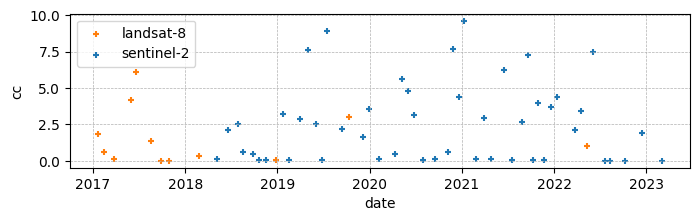

target: {'sat': 'sentinel-2', 'band': 'B02', 'res': 10, 'crs': CRS.from_epsg(32631), 'transform': Affine(10.0, 0.0, 639230.0,
       0.0, -10.0, 5456170.0), 'shape': (715, 798)}
Starting download at:  /Users/arthurcalvi/Data/disturbances-ex/france_test_indices/20170101_20231231_4824196_fr-Grand-Est-Marne_Lat49.21_Lon4.97_drought_p0.77_AC


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:  1.3min
[Parallel(n_jobs=8)]: Done  60 out of  60 | elapsed:  2.4min finished
  4%|▍         | 1/26 [02:40<1:06:54, 160.59s/it]

satellites used:  ['sentinel-2', 'landsat-8']
Items found for research 1 with cc=10 : 85


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:    6.8s
[Parallel(n_jobs=8)]: Done  59 out of  59 | elapsed:   11.8s finished


Items found for research 2 with cc=10 (on aoi) : 261
Items found for combined research:  97
Items selected to evenly space the data:  54


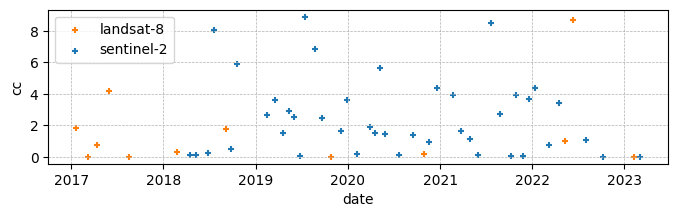

target: {'sat': 'sentinel-2', 'band': 'B02', 'res': 10, 'crs': CRS.from_epsg(32631), 'transform': Affine(10.0, 0.0, 678340.0,
       0.0, -10.0, 5451260.0), 'shape': (574, 541)}
Starting download at:  /Users/arthurcalvi/Data/disturbances-ex/france_test_indices/20170101_20231231_4827088_fr-Grand-Est-Meuse_Lat49.16_Lon5.48_drought_p0.51_AC


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:  1.2min
[Parallel(n_jobs=8)]: Done  54 out of  54 | elapsed:  2.3min finished
  8%|▊         | 2/26 [05:16<1:03:07, 157.81s/it]

satellites used:  ['sentinel-2', 'landsat-8']
Items found for research 1 with cc=10 : 305


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:    5.7s
[Parallel(n_jobs=8)]: Done  58 out of  58 | elapsed:    9.3s finished


Items found for research 2 with cc=10 (on aoi) : 578
Items found for combined research:  312
Items selected to evenly space the data:  59


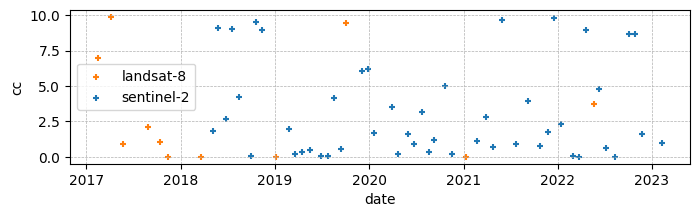

target: {'sat': 'sentinel-2', 'band': 'B02', 'res': 10, 'crs': CRS.from_epsg(32631), 'transform': Affine(10.0, 0.0, 763230.0,
       0.0, -10.0, 5315770.0), 'shape': (516, 534)}
Starting download at:  /Users/arthurcalvi/Data/disturbances-ex/france_test_indices/20170101_20231231_4831954_fr-BourgogneFrancheComte-HauteSaone_Lat47.92_Lon6.56_drought_p0.69_AC


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:   56.0s
[Parallel(n_jobs=8)]: Done  59 out of  59 | elapsed:  1.9min finished
 12%|█▏        | 3/26 [07:29<56:08, 146.46s/it]  

satellites used:  ['sentinel-2', 'landsat-8']
Items found for research 1 with cc=10 : 317


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:    6.5s
[Parallel(n_jobs=8)]: Done  64 out of  64 | elapsed:   11.4s finished


Items found for research 2 with cc=10 (on aoi) : 642
Items found for combined research:  322
Items selected to evenly space the data:  56


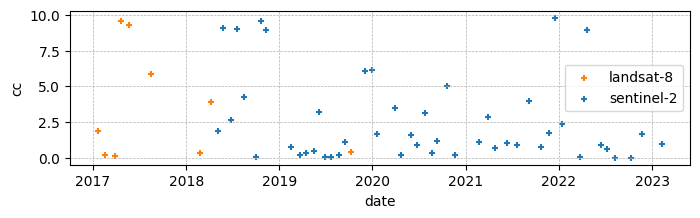

target: {'sat': 'sentinel-2', 'band': 'B02', 'res': 10, 'crs': CRS.from_epsg(32631), 'transform': Affine(10.0, 0.0, 748650.0,
       0.0, -10.0, 5366610.0), 'shape': (548, 519)}
Starting download at:  /Users/arthurcalvi/Data/disturbances-ex/france_test_indices/20170101_20231231_4830698_fr-Grand-Est-Vosges_Lat48.38_Lon6.39_drought_p0.61_AC


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:   58.4s
[Parallel(n_jobs=8)]: Done  56 out of  56 | elapsed:  1.7min finished
 15%|█▌        | 4/26 [09:32<50:19, 137.26s/it]

satellites used:  ['sentinel-2', 'landsat-8']
Items found for research 1 with cc=10 : 301


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:    8.0s
[Parallel(n_jobs=8)]: Done  76 out of  76 | elapsed:   16.4s finished


Items found for research 2 with cc=10 (on aoi) : 697
Items found for combined research:  329
Items selected to evenly space the data:  71


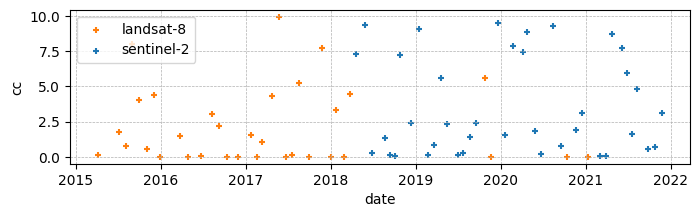

target: {'sat': 'sentinel-2', 'band': 'B02', 'res': 10, 'crs': CRS.from_epsg(32631), 'transform': Affine(10.0, 0.0, 702310.0,
       0.0, -10.0, 5158290.0), 'shape': (512, 632)}
Starting download at:  /Users/arthurcalvi/Data/disturbances-ex/france_test_indices/20150102_20211230_4730836_fr-BourgogneFrancheComte-Jura_Lat46.52_Lon5.68_drought_p0.76_AC


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:  1.6min
[Parallel(n_jobs=8)]: Done  71 out of  71 | elapsed:  3.0min finished
 19%|█▉        | 5/26 [13:00<56:55, 162.67s/it]

satellites used:  ['sentinel-2', 'landsat-8']
Items found for research 1 with cc=10 : 189


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:    6.6s
[Parallel(n_jobs=8)]: Done  50 out of  50 | elapsed:   10.6s finished


Items found for research 2 with cc=10 (on aoi) : 554
Items found for combined research:  203
Items selected to evenly space the data:  60


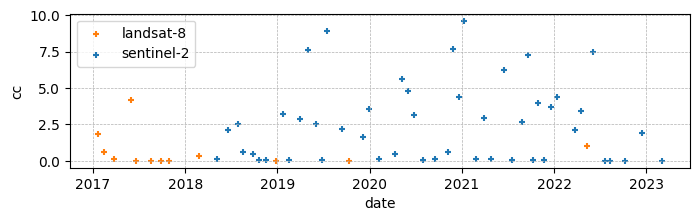

target: {'sat': 'sentinel-2', 'band': 'B02', 'res': 10, 'crs': CRS.from_epsg(32631), 'transform': Affine(10.0, 0.0, 641740.0,
       0.0, -10.0, 5452600.0), 'shape': (495, 493)}
Starting download at:  /Users/arthurcalvi/Data/disturbances-ex/france_test_indices/20170101_20231231_4824184_fr-Grand-Est-Meuse_Lat49.19_Lon4.98_drought_p0.53_AC


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:   54.6s
[Parallel(n_jobs=8)]: Done  60 out of  60 | elapsed:  1.8min finished
 23%|██▎       | 6/26 [15:07<50:09, 150.49s/it]

satellites used:  ['sentinel-2', 'landsat-8']
Items found for research 1 with cc=10 : 189


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:    6.4s
[Parallel(n_jobs=8)]: Done  50 out of  50 | elapsed:   10.5s finished


Items found for research 2 with cc=10 (on aoi) : 552
Items found for combined research:  204
Items selected to evenly space the data:  60


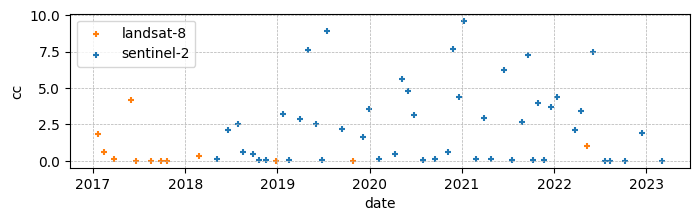

target: {'sat': 'sentinel-2', 'band': 'B02', 'res': 10, 'crs': CRS.from_epsg(32631), 'transform': Affine(10.0, 0.0, 640210.0,
       0.0, -10.0, 5459210.0), 'shape': (503, 486)}
Starting download at:  /Users/arthurcalvi/Data/disturbances-ex/france_test_indices/20170101_20231231_4823427_fr-Grand-Est_Lat49.25_Lon4.96_drought_p0.69_AC


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:  1.1min
[Parallel(n_jobs=8)]: Done  60 out of  60 | elapsed:  2.2min finished
 27%|██▋       | 7/26 [17:36<47:34, 150.24s/it]

satellites used:  ['landsat-5', 'landsat-7']
Items found for research 1 with cc=10 : 86


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:    8.1s
[Parallel(n_jobs=8)]: Done  67 out of  67 | elapsed:   17.8s finished


Items found for research 2 with cc=10 (on aoi) : 235
Items found for combined research:  107
Items selected to evenly space the data:  52


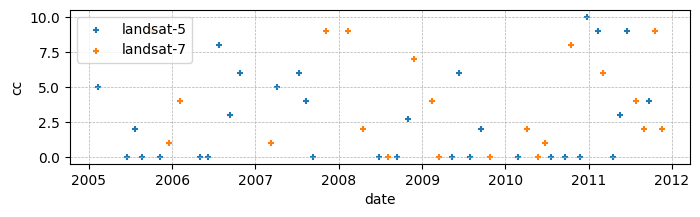

target: {'sat': 'landsat-7', 'band': 'pan', 'res': 15, 'crs': CRS.from_epsg(32630), 'transform': Affine(15.0, 0.0, 628597.5,
       0.0, -15.0, 4866682.5), 'shape': (363, 335)}
Starting download at:  /Users/arthurcalvi/Data/disturbances-ex/france_test_indices/20050101_20111231_3503746_fr-NouvelleAquitaine-Landes-VielleSaintGirons_Lat43.92_Lon-1.37_drought_p0.58_ABC


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:  1.0min
[Parallel(n_jobs=8)]: Done  52 out of  52 | elapsed:  2.1min finished
 31%|███       | 8/26 [20:07<45:05, 150.33s/it]

satellites used:  ['sentinel-2', 'landsat-8']
Items found for research 1 with cc=10 : 85


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:    6.2s
[Parallel(n_jobs=8)]: Done  59 out of  59 | elapsed:   11.4s finished


Items found for research 2 with cc=10 (on aoi) : 261
Items found for combined research:  96
Items selected to evenly space the data:  54


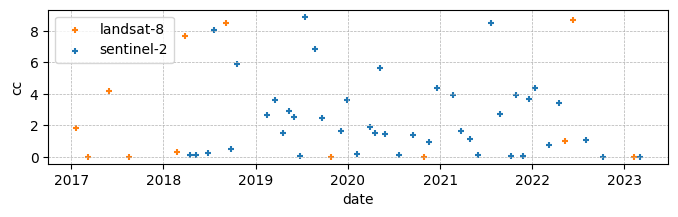

target: {'sat': 'sentinel-2', 'band': 'B02', 'res': 10, 'crs': CRS.from_epsg(32631), 'transform': Affine(10.0, 0.0, 676210.0,
       0.0, -10.0, 5454860.0), 'shape': (499, 491)}
Starting download at:  /Users/arthurcalvi/Data/disturbances-ex/france_test_indices/20170101_20231231_4827096_fr-Grand-Est-Meuse-DouaumontVaux_Lat49.20_Lon5.45_drought_p0.76_AC


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:   55.5s
[Parallel(n_jobs=8)]: Done  54 out of  54 | elapsed:  1.8min finished
 35%|███▍      | 9/26 [22:15<40:37, 143.37s/it]

satellites used:  ['sentinel-2', 'landsat-8']
Items found for research 1 with cc=10 : 305


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:    5.4s
[Parallel(n_jobs=8)]: Done  58 out of  58 | elapsed:    8.9s finished


Items found for research 2 with cc=10 (on aoi) : 578
Items found for combined research:  313
Items selected to evenly space the data:  59


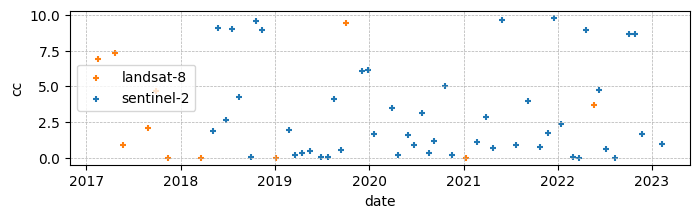

target: {'sat': 'sentinel-2', 'band': 'B02', 'res': 10, 'crs': CRS.from_epsg(32631), 'transform': Affine(10.0, 0.0, 763400.0,
       0.0, -10.0, 5310770.0), 'shape': (501, 507)}
Starting download at:  /Users/arthurcalvi/Data/disturbances-ex/france_test_indices/20170101_20231231_4831849_fr-BourgogneFrancheComte-HauteSaone_Lat47.87_Lon6.56_drought_p0.64_AC


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:   57.6s
[Parallel(n_jobs=8)]: Done  59 out of  59 | elapsed:  1.9min finished
 38%|███▊      | 10/26 [24:28<37:21, 140.12s/it]

satellites used:  ['sentinel-2', 'landsat-8']
Items found for research 1 with cc=10 : 189


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:    6.3s
[Parallel(n_jobs=8)]: Done  50 out of  50 | elapsed:   10.5s finished


Items found for research 2 with cc=10 (on aoi) : 554
Items found for combined research:  203
Items selected to evenly space the data:  60


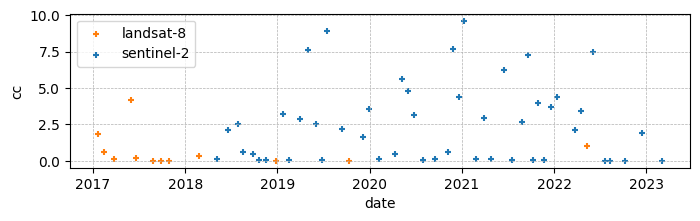

target: {'sat': 'sentinel-2', 'band': 'B02', 'res': 10, 'crs': CRS.from_epsg(32631), 'transform': Affine(10.0, 0.0, 636260.0,
       0.0, -10.0, 5454650.0), 'shape': (464, 542)}
Starting download at:  /Users/arthurcalvi/Data/disturbances-ex/france_test_indices/20170101_20231231_4823415_fr-Grand-Est-Marne_Lat49.21_Lon4.91_drought_p0.54_AC


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:  1.1min
[Parallel(n_jobs=8)]: Done  60 out of  60 | elapsed:  2.1min finished
 42%|████▏     | 11/26 [26:53<35:25, 141.67s/it]

satellites used:  ['landsat-5', 'landsat-7']
Items found for research 1 with cc=10 : 86


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:    8.0s
[Parallel(n_jobs=8)]: Done  67 out of  67 | elapsed:   17.4s finished


Items found for research 2 with cc=10 (on aoi) : 235
Items found for combined research:  110
Items selected to evenly space the data:  54


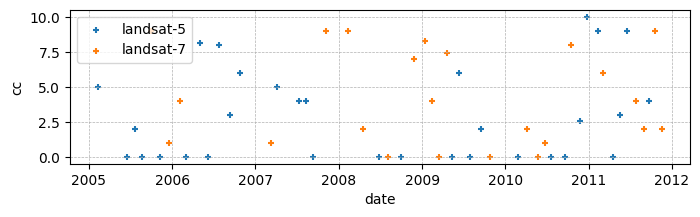

target: {'sat': 'landsat-7', 'band': 'pan', 'res': 15, 'crs': CRS.from_epsg(32630), 'transform': Affine(15.0, 0.0, 630337.5,
       0.0, -15.0, 4865512.5), 'shape': (349, 343)}
Starting download at:  /Users/arthurcalvi/Data/disturbances-ex/france_test_indices/20050101_20111231_3503724_fr-NouvelleAquitaine-Landes-VielleSaintGirons_Lat43.91_Lon-1.35_drought_p0.53_ABC


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:  1.1min
[Parallel(n_jobs=8)]: Done  54 out of  54 | elapsed:  2.1min finished
 46%|████▌     | 12/26 [29:26<33:52, 145.15s/it]

satellites used:  ['sentinel-2', 'landsat-8']
Items found for research 1 with cc=10 : 85


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:    6.0s
[Parallel(n_jobs=8)]: Done  59 out of  59 | elapsed:   11.5s finished


Items found for research 2 with cc=10 (on aoi) : 261
Items found for combined research:  96
Items selected to evenly space the data:  53


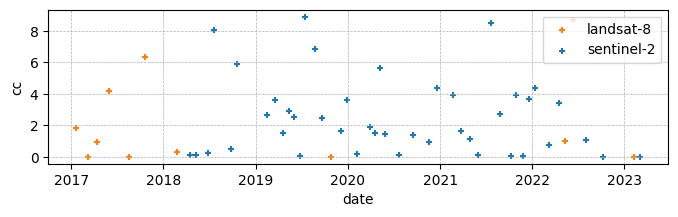

target: {'sat': 'sentinel-2', 'band': 'B02', 'res': 10, 'crs': CRS.from_epsg(32631), 'transform': Affine(10.0, 0.0, 677020.0,
       0.0, -10.0, 5455570.0), 'shape': (468, 492)}
Starting download at:  /Users/arthurcalvi/Data/disturbances-ex/france_test_indices/20170101_20231231_4827097_fr-Grand-Est-Meuse-DouaumontVaux_Lat49.21_Lon5.46_drought_p0.73_AC


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:   58.7s
[Parallel(n_jobs=8)]: Done  53 out of  53 | elapsed:  1.9min finished
 50%|█████     | 13/26 [31:40<30:41, 141.69s/it]

satellites used:  ['sentinel-2', 'landsat-8']
Items found for research 1 with cc=10 : 85


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:    6.0s
[Parallel(n_jobs=8)]: Done  56 out of  56 | elapsed:   10.5s finished


Items found for research 2 with cc=10 (on aoi) : 258
Items found for combined research:  97
Items selected to evenly space the data:  54


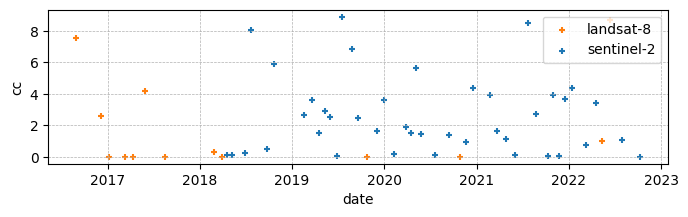

target: {'sat': 'sentinel-2', 'band': 'B02', 'res': 10, 'crs': CRS.from_epsg(32631), 'transform': Affine(10.0, 0.0, 676500.0,
       0.0, -10.0, 5454630.0), 'shape': (484, 486)}
Starting download at:  /Users/arthurcalvi/Data/disturbances-ex/france_test_indices/20160102_20221230_4777784_fr-Grand-Est-Meuse-DouaumontVaux_Lat49.20_Lon5.46_drought_p0.89_AC


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:   53.9s
[Parallel(n_jobs=8)]: Done  54 out of  54 | elapsed:  1.7min finished
 54%|█████▍    | 14/26 [33:41<27:06, 135.54s/it]

satellites used:  ['landsat-5', 'landsat-7', 'landsat-8']
Items found for research 1 with cc=10 : 66


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:   10.0s
[Parallel(n_jobs=8)]: Done  60 out of  60 | elapsed:   19.7s finished


Items found for research 2 with cc=10 (on aoi) : 178
Items found for combined research:  98
Items selected to evenly space the data:  56


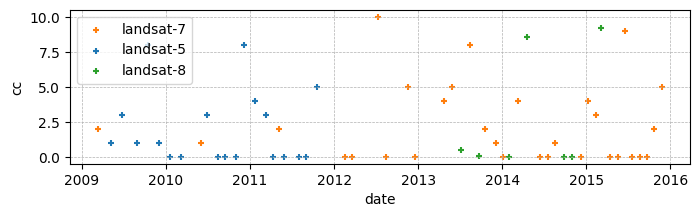

target: {'sat': 'landsat-7', 'band': 'pan', 'res': 15, 'crs': CRS.from_epsg(32631), 'transform': Affine(15.0, 0.0, 538642.5,
       0.0, -15.0, 4813222.5), 'shape': (327, 334)}
Starting download at:  /Users/arthurcalvi/Data/disturbances-ex/france_test_indices/20090101_20151231_4175792_fr-Occitanie-Herault_Lat43.45_Lon3.51_drought_p0.86_AC


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:  1.1min
[Parallel(n_jobs=8)]: Done  56 out of  56 | elapsed:  2.6min finished
 58%|█████▊    | 15/26 [36:47<27:37, 150.66s/it]

satellites used:  ['sentinel-2', 'landsat-5', 'landsat-7', 'landsat-8']
Items found for research 1 with cc=10 : 97


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:    7.9s
[Parallel(n_jobs=8)]: Done  79 out of  79 | elapsed:   20.4s finished


Items found for research 2 with cc=10 (on aoi) : 305
Items found for combined research:  118
Items selected to evenly space the data:  57


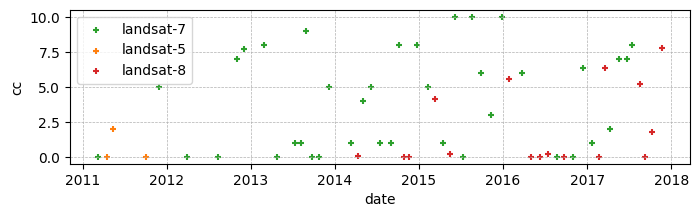

 62%|██████▏   | 16/26 [37:13<18:51, 113.16s/it]

target not available
satellites used:  ['sentinel-2', 'landsat-8']
Items found for research 1 with cc=10 : 373


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:    6.8s
[Parallel(n_jobs=8)]: Done  59 out of  59 | elapsed:   12.2s finished


Items found for research 2 with cc=10 (on aoi) : 700
Items found for combined research:  396
Items selected to evenly space the data:  72


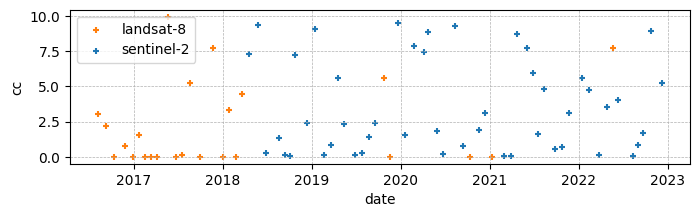

target: {'sat': 'sentinel-2', 'band': 'B02', 'res': 10, 'crs': CRS.from_epsg(32631), 'transform': Affine(10.0, 0.0, 701840.0,
       0.0, -10.0, 5139480.0), 'shape': (495, 475)}
Starting download at:  /Users/arthurcalvi/Data/disturbances-ex/france_test_indices/20160102_20221230_4777549_fr-BourgogneFrancheComte-Jura_Lat46.36_Lon5.65_drought_p0.92_AC


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:  1.4min
[Parallel(n_jobs=8)]: Done  72 out of  72 | elapsed:  2.9min finished
 65%|██████▌   | 17/26 [40:30<20:44, 138.24s/it]

satellites used:  ['sentinel-2', 'landsat-8']
Items found for research 1 with cc=10 : 177


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:    8.4s
[Parallel(n_jobs=8)]: Done  56 out of  56 | elapsed:   12.7s finished


Items found for research 2 with cc=10 (on aoi) : 446
Items found for combined research:  192
Items selected to evenly space the data:  54


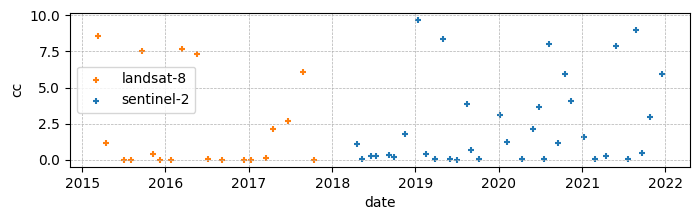

target: {'sat': 'sentinel-2', 'band': 'B02', 'res': 10, 'crs': CRS.from_epsg(32631), 'transform': Affine(10.0, 0.0, 407470.0,
       0.0, -10.0, 4931030.0), 'shape': (495, 505)}
Starting download at:  /Users/arthurcalvi/Data/disturbances-ex/france_test_indices/20150102_20211230_4718443_fr-Occitanie-Lot_Lat44.50_Lon1.87_drought_p0.88_AC


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:  1.3min
[Parallel(n_jobs=8)]: Done  54 out of  54 | elapsed:  1.9min finished
 69%|██████▉   | 18/26 [42:43<18:14, 136.75s/it]

satellites used:  ['sentinel-2', 'landsat-5', 'landsat-7', 'landsat-8']
Items found for research 1 with cc=10 : 97


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:    7.7s
[Parallel(n_jobs=8)]: Done  79 out of  79 | elapsed:   19.7s finished


Items found for research 2 with cc=10 (on aoi) : 305
Items found for combined research:  122
Items selected to evenly space the data:  58


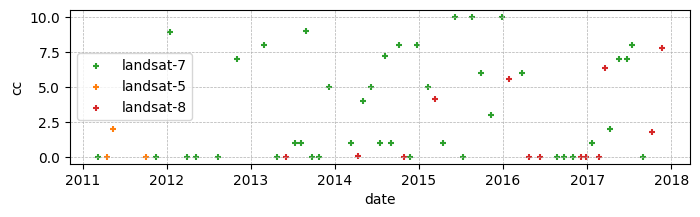

 73%|███████▎  | 19/26 [43:07<12:01, 103.08s/it]

target not available
satellites used:  ['sentinel-2', 'landsat-5', 'landsat-7', 'landsat-8']
Items found for research 1 with cc=10 : 97


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:    7.3s
[Parallel(n_jobs=8)]: Done  79 out of  79 | elapsed:   17.9s finished


Items found for research 2 with cc=10 (on aoi) : 305
Items found for combined research:  119
Items selected to evenly space the data:  58


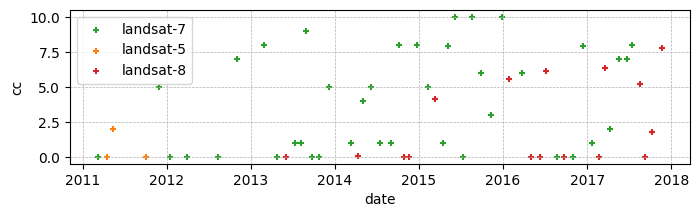

 77%|███████▋  | 20/26 [43:29<07:52, 78.73s/it] 

target not available
satellites used:  ['landsat-5', 'landsat-7', 'landsat-8']
Items found for research 1 with cc=10 : 55


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:    8.5s
[Parallel(n_jobs=8)]: Done 128 out of 128 | elapsed:   34.8s finished
 77%|███████▋  | 20/26 [44:09<13:14, 132.47s/it]


Items found for research 2 with cc=10 (on aoi) : 271
Items found for combined research:  92


FileNotFoundError: [Errno 2] No such file or directory: '/Users/arthurcalvi/Data/disturbances-ex/france_test_indices/20100102_20161230_4236199_fr-Bretagne-IlleetVilaine_Lat48.04_Lon-2.24_drought_p0.85_AC'

In [66]:
from datetime import datetime, timedelta
from tqdm import tqdm
from rasterio.warp import transform_geom
from shapely.geometry import shape 
delta = timedelta(days=3*365)

import pandas as pd
chr = Chronos(delta_min=20, cc1=10, cc2=75, buffer=3000,
                pansharpening=True, sharpening=True, force_reproject=False, 
                    normalization=None, verbose=2, n_jobs=8, prefer='threads')

for cause in ['drought', 'insect', 'storm', 'fire', 'other', 'ND']:
    t_gdf = gdf[ (gdf.main_prob > 0.5) & (gdf.main_cause == cause) ].drop_duplicates(subset='index')
    t_gdf['area'] = t_gdf.geometry.area
    t_gdf = t_gdf[ (t_gdf.area > (10*30)**2) ]
    t_gdf_area = t_gdf.sort_values('area', ascending=False).iloc[:13]
    t_gdf_prob = t_gdf[t_gdf != 0.92].sort_values('main_prob', ascending=False).iloc[:13]
    t_gdf = gpd.GeoDataFrame(pd.concat([t_gdf_area, t_gdf_prob]), crs=t_gdf.crs)
    table = t_gdf.sort_values('area', ascending=False)
    print(cause)
    for i in tqdm(range(table.shape[0])):
        row = table.iloc[i]
        start_date = datetime(year=row.year,month=1, day=1) - delta #
        end_date = datetime(year=row.year,month=12, day=31) + delta

        dir_ = '/Users/arthurcalvi/Data/disturbances-ex/france_test_indices'

        geometry = transform_geom('epsg:3857', 'epsg:4326', shape(row.geometry).convex_hull)
        #loc
        name, Latitude, Longitude = localisation(geometry)

        #sources
        sources = 'A'
        if row.causes_B is not None:
            sources = sources + 'B'
        if row.causes_C is not None:
            sources = sources + 'C'

        name_folder = '_'.join([start_date.strftime('%Y%m%d'), end_date.strftime('%Y%m%d'), str(row['index']), name, f'Lat{float(Latitude) :.2f}', f'Lon{float(Longitude) :.2f}', str(row['main_cause']), f"p{row.main_prob :.2f}",  sources])
        folder = os.path.join(dir_, name_folder)
        if os.path.isdir(folder):
            pass
        else :
            try :
                results = chr.download(folder, row.geometry, start_date, end_date, indices=['rgb', 'evi', 'ndvi', 'nbr', 'ndwi', 'crswir'])
            except : 
                os.removedirs(folder)